In [330]:
from main import *
from useful_functions import *
from visualization import *

import bct

%matplotlib inline
plt.rcParams['font.size'] = 6

# Important refs

- 2024: https://www.nature.com/articles/s42003-024-05766-w
- 2021: https://direct.mit.edu/netn/article/5/2/405/97538/Dynamic-expression-of-brain-functional-systems
- 2021: https://www.pnas.org/doi/abs/10.1073/pnas.2109380118

#### To-do list

- Compute RMS to find peaks of activity.
- Compute hierarchical clustering of states and find number of clusters based on statistical criterion.
- Determine if coactivation patterns are significantly modular.

# Setting paths

In [185]:
top_directory = '/media/anleg84/One Touch/Data/Main/'
atlas_path = '/home/anleg84/Documents/Atlas/Mapzebrain/'

In [186]:
atlas = MapzebrainAtlas(atlas_path)
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]
excluded = np.load('Results/excluded_regions.npy')

centroids_ = np.delete(centroids, np.concatenate([excluded, excluded + 70]), axis=0)

In [187]:
datasets = get_datasets(top_directory, keywords=['920nm'], exclude=[])
print(len(datasets))

22


In [188]:
W_dir = np.load('Results/directed_terminals_expanded.npy')
W_und = np.load('Results/undirected_terminals_expanded.npy')
FC = np.load('Results/FC_matrix.npy')

In [189]:
delete = delete_rows_and_columns

# Computing bilateral regional time series

In [22]:
for folder in tqdm(datasets, file=sys.stdout):
    
    data = load_data(folder)
    dff = np.load(folder + 'dff.npy')
    left = data['centroids_atlas'][:, 0] <= 284
    right = data['centroids_atlas'][:, 0] > 284
    region_series = np.zeros((140, dff.shape[1]))
    for i in range(70):
        in_region = data['region_labels'][:, i] != 0
        if np.any(in_region & left):
            region_series[i] = np.mean(dff[in_region & left], axis=0)
        if np.any(in_region & right):
            region_series[i + 70] = np.mean(dff[in_region & right], axis=0)

    np.save(folder + 'region_series_dff_bilateral.npy', region_series)

100%|███████████████████████████████████████████| 22/22 [06:59<00:00, 19.05s/it]


# Loading bilateral time series and excluding regions

In [271]:
sigma = 2

rseries = []
for ds in datasets:
    rseries.append(np.load(ds + 'region_series_dff_bilateral.npy')[:, :600])
    for i in range(rseries[-1].shape[0]):
        rseries[-1][i] = gaussian_filter1d(rseries[-1][i], sigma)

In [272]:
excluded = np.unique(np.where(np.sum((np.sum(np.stack(rseries, axis=0), axis=2) == 0), axis=0) != 0)[0] % 70)
excluded = np.unique(np.concatenate([[10], excluded]))
excluded = np.concatenate([excluded, excluded + 70])

In [273]:
for i in range(len(rseries)):
    rseries[i] = np.delete(rseries[i], excluded, axis=0)

In [274]:
def normalize_rows(timeseries):
    normalized = np.copy(timeseries)
    for i in range(timeseries.shape[0]):
        normalized[i] -= np.min(timeseries[0])
        normalized[i]/= np.max(normalized[i])
    return normalized

In [275]:
for i in range(len(rseries)):
    dff = compute_dff_using_minfilter(rseries[i],
                                          window=30,
                                          sigma1=3,
                                          sigma2=30)
    #dff = remove_global_signal(dff)
    rseries[i] = zscore(dff, axis=1)


# State matrix

In [276]:
state_matrix = np.concatenate(rseries, axis=1)
R = state_matrix.shape[0]

save = False
if save:
    np.save('Results/regional_state_matrix.npy', state_matrix)

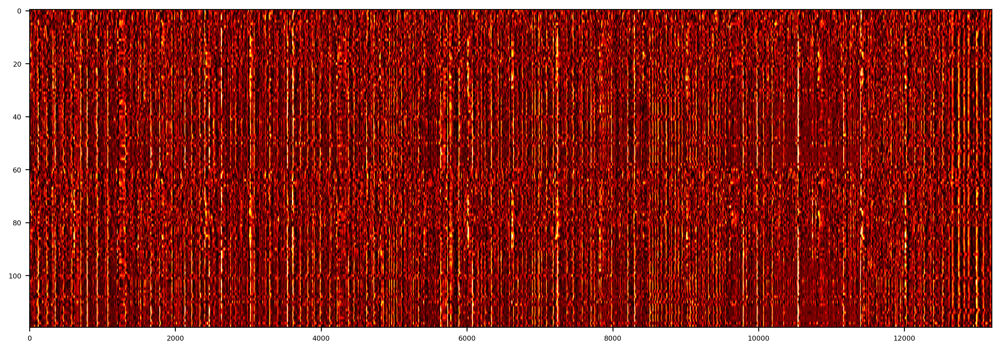

In [277]:
plt.figure(figsize=(15, 5), dpi=300)
plt.imshow(state_matrix, cmap='hot', aspect='auto', vmin=-1, vmax=4)

# Identifying clusters

In [278]:
from sklearn.cluster import KMeans

In [279]:
clustering = KMeans(n_clusters=10).fit(state_matrix.T)
clusters = clustering.labels_

In [280]:
cluster_centroids = []
for c in np.unique(clusters):
    centroid = np.mean(state_matrix[:, clusters == c], axis=1)
    cluster_centroids.append(centroid)

coactivation_patterns = []
for c in cluster_centroids:
    coactivation = c.reshape(R, 1) @ c.reshape(1, R)
    coactivation_patterns.append(coactivation)

#### Random coactivation patterns

In [281]:
from brainsmash.mapgen.base import Base

@njit
def compute_distances(centroids):
    dist_matrix = np.zeros((centroids.shape[0], centroids.shape[0]))
    for i in range(centroids.shape[0]):
        for j in range(i + 1):
            dist_matrix[i, j] = np.sqrt(np.sum((centroids[i] - centroids[j]) ** 2))
            dist_matrix[j, i] = dist_matrix[i, j]
    return dist_matrix

def plot_node_values(ax, values, atlas, excluded=None, view='top', double_vector=False, s=25, linewidth=1, cmap='hot', edgecolor='black'):
    if excluded is None:
        excluded = []
    if view == 'top':
        ax.imshow(atlas.XYprojection, cmap='gray')
        centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
        centroids[:, 1] = 974 - centroids[:, 1]
        if double_vector:
            values = double(values)
            excluded = np.concatenate([excluded, excluded + 70])
        centroids = np.delete(centroids, excluded, axis=0)
        ax.scatter(centroids[:, 0], centroids[:, 1], cmap=cmap, c=values, linewidth=linewidth, s=s, edgecolor=edgecolor)

In [282]:
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]
centroids = np.delete(centroids, excluded, axis=0)

In [283]:
distances = compute_distances(centroids)

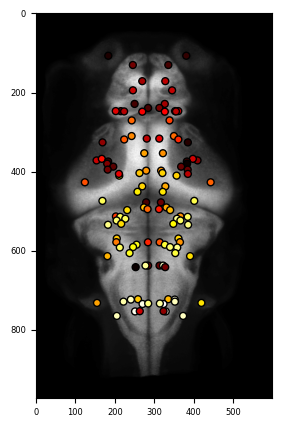

In [284]:
cap = cluster_centroids[9]

fig, ax = plt.subplots(figsize=(5, 5))
plot_node_values(ax, cap, atlas, excluded=excluded)
plt.show()

# Reordering coactivations by communities

In [285]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, ward, leaves_list, set_link_color_palette

def double(vector):
    return np.concatenate([vector, vector])

def reorder_clusters_anteroposterior(clusters):
    mean_cluster_ids = []
    for c in np.unique(clusters):
        mean_cluster_ids.append(np.mean(np.where(clusters == c)[0]))
    order = np.argsort(mean_cluster_ids) + 1
    new_clusters = np.zeros((len(clusters), ))
    for i, c in enumerate(order):
        new_clusters[clusters == c] = i + 1
    return new_clusters.astype('int')

def plot_matrix_communities(ax, matrix, communities, cmap='coolwarm', edgecolor='black', linewidth=1, output=False, vmin=0, vmax=1):
    ids = np.argsort(communities)
    transitions = list(np.where(np.diff(communities[ids]) != 0)[0])
    boundaries = [0]
    for value in transitions:
        boundaries.append(value + 1)
    boundaries.append(matrix.shape[0])
    
    im = ax.imshow(matrix[ids, :][:, ids], cmap=cmap, vmin=vmin, vmax=vmax)
    if type(edgecolor) == str:
        edgecolor = [edgecolor] * len(np.unique(communities))
    for i, community in enumerate(np.unique(communities)):
        r1, r2 = boundaries[i] - 0.5, boundaries[i + 1] - 0.5
        rect = patches.Rectangle((r1, r1), r2 - r1, r2 - r1, linewidth=linewidth, edgecolor=edgecolor[i], facecolor='none')
        ax.add_patch(rect)
    if output:
        return im

def plot_surrogates(activation, distances, communities, n=10, resample=True):
    base = Base(x=activation, D=distances, resample=resample)
    surrogates = base(n=n)
    R = len(activation)
    cap = activation.reshape(R, 1) @ activation.reshape(1, R)
    surrogate_caps = []
    for s in surrogates:
        surrogate_caps.append(s.reshape(R, 1) @ s.reshape(1, R))

    fig, ax = plt.subplots(3, 5, figsize=(10, 7))
    v = np.percentile(np.abs(cap), 95)

    plot_matrix_communities(ax[0, 2], cap, communities, vmin=-v, vmax=v)
    for i, s in enumerate(surrogate_caps):
        a = ax.flatten()[i + 5]
        v = np.percentile(np.abs(s), 95)
        plot_matrix_communities(a, s, communities, vmin=-v, vmax=v)
    for i, a in enumerate(ax.flatten()):
        if i in [0, 1, 3, 4]:
            a.axis('off')
        else:
            a.set_xticks([])
            a.set_yticks([])
    plt.show()

In [286]:
coassignment_matrix_SC = np.load('Results/coassignment_matrix_optimized_SC.npy')

In [323]:
Z = linkage(1 - coassignment_matrix_SC, 'average')
ids_Z = np.flip(leaves_list(Z)).astype('int')
communities = reorder_clusters_anteroposterior(fcluster(Z, t=4, criterion='maxclust'))
communities = np.delete(double(communities), excluded)

In [324]:
def compute_mean_coactivation_per_module(vector, communities):
    V = vector.flatten()
    N = len(vector)
    matrix = V.reshape(N, 1) @ V.reshape(1, N)
    ids = np.argsort(communities)
    reordered_matrix = matrix[ids, :][:, ids]
    reordered_communities = communities[ids]
    mean_coactivation_per_module, std_coactivation_per_module = [], []
    for c in np.unique(communities):
        block = reordered_matrix[reordered_communities == c, :][:, reordered_communities == c]
        mean_coactivation_per_module.append(np.abs(np.mean(block)))
        std_coactivation_per_module.append(np.std(block))
    return mean_coactivation_per_module, std_coactivation_per_module

In [325]:
def compute_mean_coactivation_per_module_null(vector, distances, communities, n_surrogates=100, resample=True):
    V = vector.flatten()
    base = Base(x=vector, D=distances, resample=resample)
    surrogates = base(n=n_surrogates)
    ids = np.argsort(communities)
    means_surrogates, stds_surrogates = [], []
    for s in surrogates:
        N = len(s)
        matrix = s.reshape(N, 1) @ s.reshape(1, N)
        reordered_matrix, reordered_communities = matrix[ids, :][:, ids], communities[ids]
        mean_coactivation_per_module, std_coactivation_per_module = [], []
        for c in np.unique(communities):
            block = reordered_matrix[reordered_communities == c, :][:, reordered_communities == c]
            mean_coactivation_per_module.append(np.abs(np.mean(block)))
            std_coactivation_per_module.append(np.std(block))
        means_surrogates.append(mean_coactivation_per_module)
        stds_surrogates.append(std_coactivation_per_module)
    return np.stack(means_surrogates), np.stack(stds_surrogates)

In [326]:
mean_coactivations, std_coactivations = [], []
mean_coactivations_null, std_coactivations_null = [], []

for c in tqdm(cluster_centroids, file=sys.stdout):
    
    mean, std = compute_mean_coactivation_per_module(c, communities)
    mean_null, std_null = compute_mean_coactivation_per_module_null(c, distances, communities, n_surrogates=100)
    
    mean_coactivations.append(mean)
    std_coactivations.append(std)
    mean_coactivations_null.append(mean_null)
    std_coactivations_null.append(std_null)

100%|███████████████████████████████████████████| 10/10 [00:49<00:00,  4.90s/it]


In [327]:
empirical = np.array(mean_coactivations)
null = np.percentile(np.array(mean_coactivations_null), 95, axis=1)

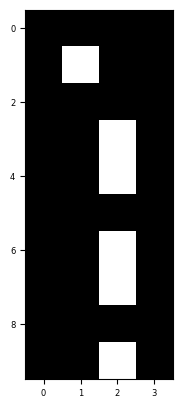

In [328]:
plt.imshow(empirical > null, cmap='gray')

Centroid 0


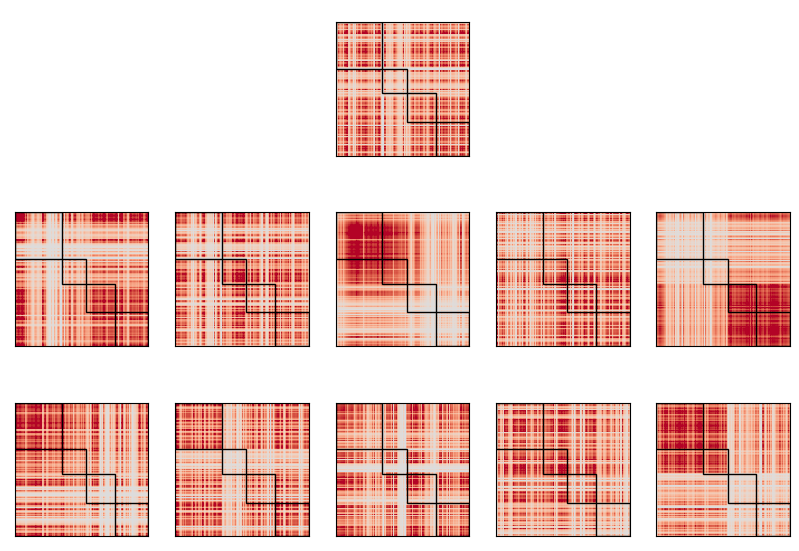

Centroid 1


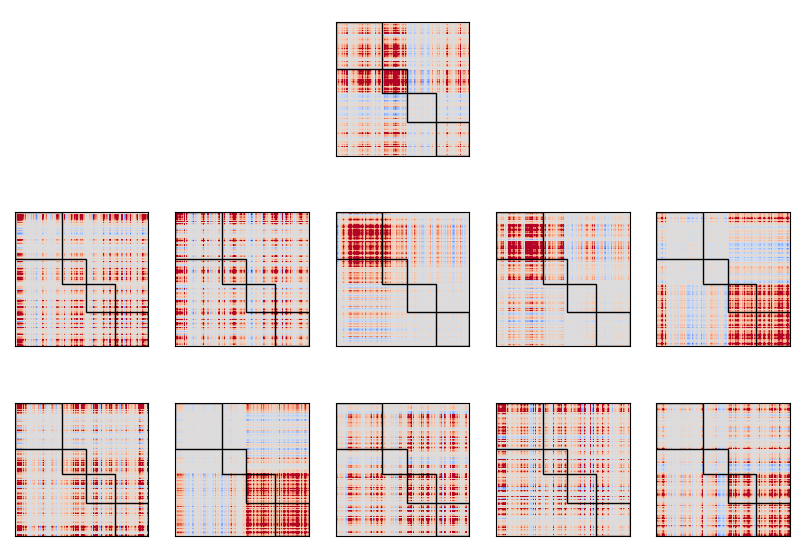

Centroid 2


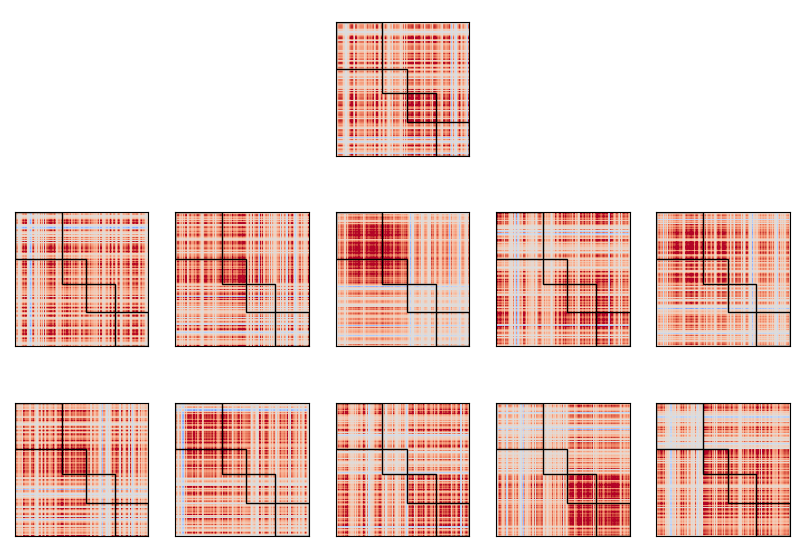

Centroid 3


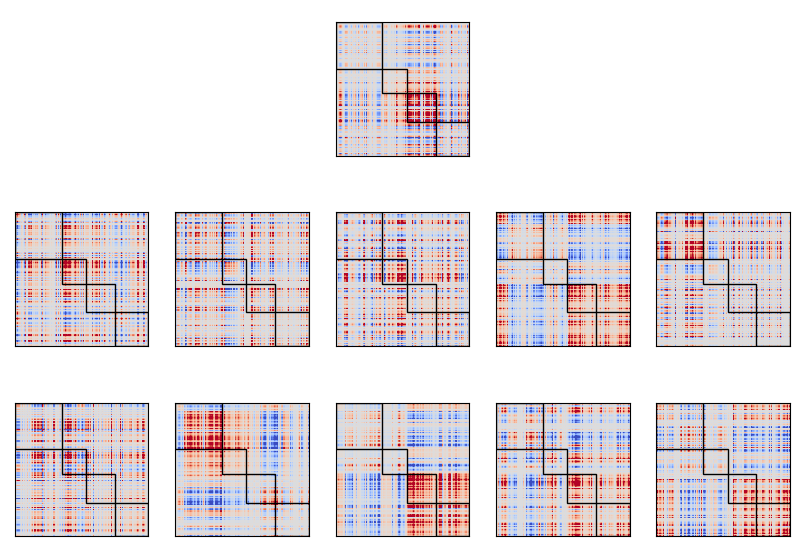

Centroid 4


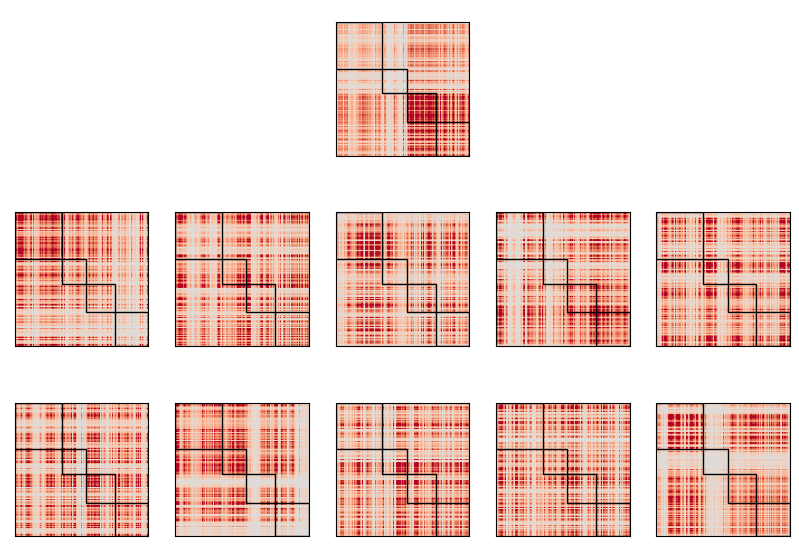

Centroid 5


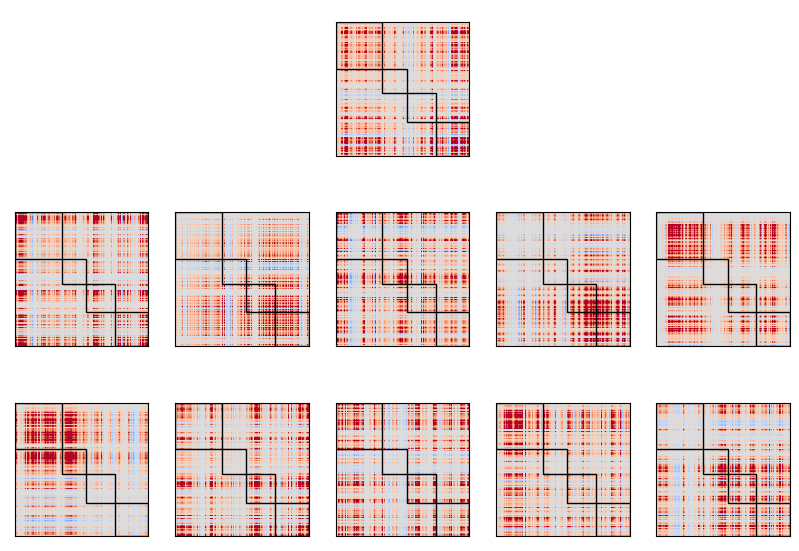

Centroid 6


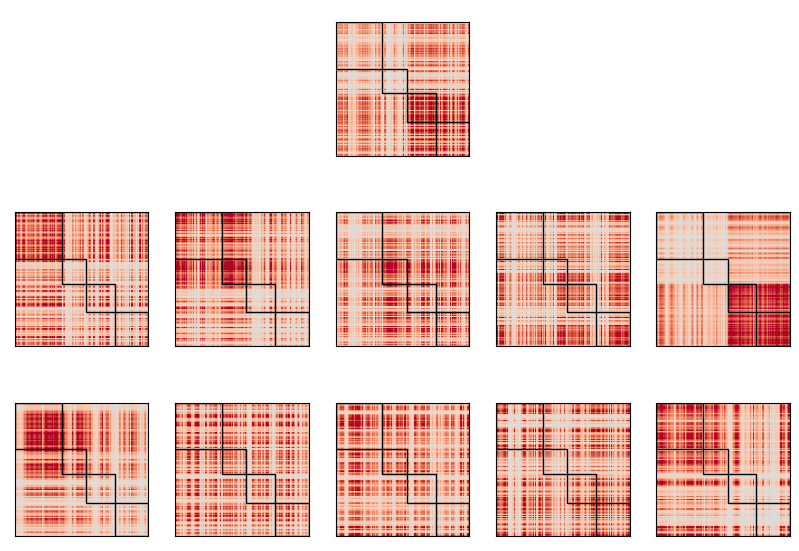

Centroid 7


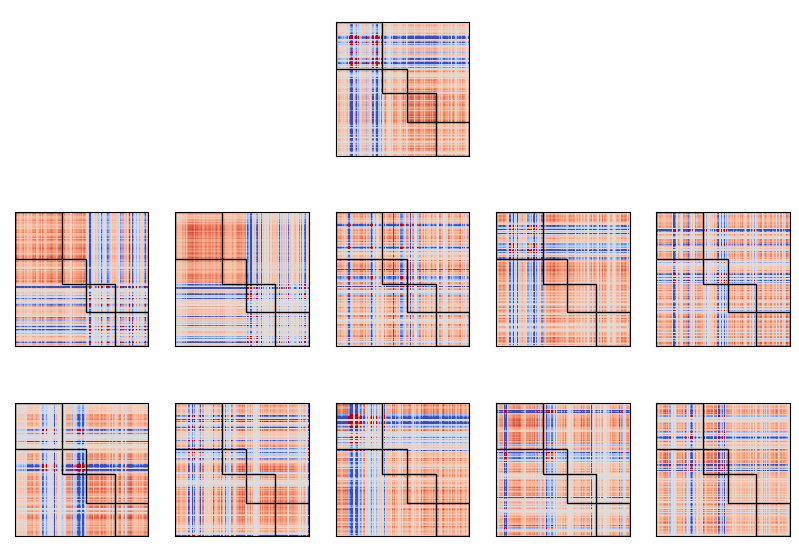

Centroid 8


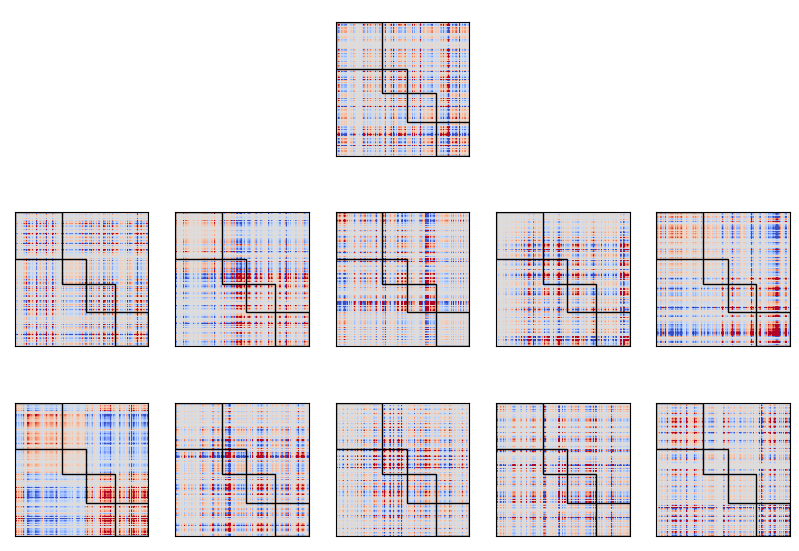

Centroid 9


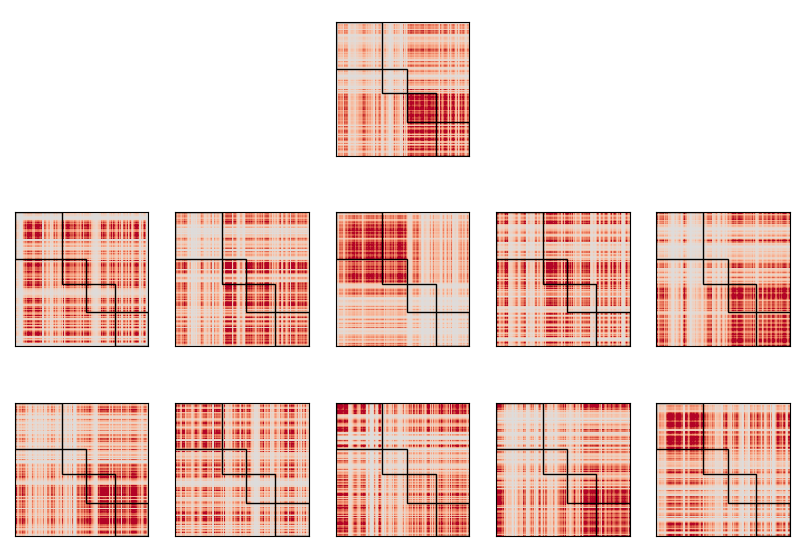

In [329]:
for i, c in enumerate(cluster_centroids):
    print('Centroid {}'.format(i))
    plot_surrogates(c, distances, communities)
    

# Testing modularity of each CAP

In [280]:
@njit
def modularity_score(adjacency_matrix, community_labels):
    m = adjacency_matrix.sum() / 2 
    degrees = adjacency_matrix.sum(axis=1)
    modularity = 0.0
    for i in range(adjacency_matrix.shape[0]):
        for j in range(adjacency_matrix.shape[1]):
            if community_labels[i] == community_labels[j]:
                modularity += adjacency_matrix[i, j] - (degrees[i] * degrees[j]) / (2 * m)
    return modularity / (2 * m)

def compute_modularity_curve(coassignment, matrix, excluded=None, N_min=2, N_max=10, linkage_method='ward'):
    if excluded is None:
        excluded = []
    Q_values = []
    for N in range(N_min, N_max + 1):
        Z = linkage(1 - coassignment, linkage_method)
        communities = reorder_clusters_anteroposterior(fcluster(Z, t=N, criterion='maxclust'))
        communities = double(communities)
        Q = modularity_score(matrix, np.delete(communities, excluded))
        Q_values.append(Q)
    return np.array(Q_values)

def compute_coactivation(vector):
    V = vector.flatten()
    N = len(V)
    return V.reshape(N, 1) @ V.reshape(1, N)

def normalize(matrix):
    normed = np.copy(matrix)
    normed -= np.min(normed)
    normed /= np.max(normed)
    return normed

In [282]:
normalized_CAPs = []
for CAP in coactivation_patterns:
    normalized_CAPs.append(normalize(CAP))

In [292]:
modularities = []
for nCAP in normalized_CAPs:
    Q = compute_modularity_curve(coassignment_matrix_SC, nCAP, excluded=excluded)
    modularities.append(Q)
modularities = np.stack(modularities)

In [295]:
modularities_null = []
for i in tqdm(range(len(cluster_centroids)), file=sys.stdout):
    activation = cluster_centroids[0]
    base = Base(x=activation, D=distances, resample=True)
    surrogates = base(n=100)
    null_curves = []
    for s in surrogates:
        cap_null = normalize(compute_coactivation(s))
        Q_null = compute_modularity_curve(coassignment_matrix_SC, cap_null, excluded=excluded)
        null_curves.append(Q_null)
    modularities_null.append(np.array(null_curves))

100%|███████████████████████████████████████████| 20/20 [01:40<00:00,  5.03s/it]


In [298]:
modularities_null = np.stack(modularities_null, axis=0)

In [300]:
modularities_null.shape

(20, 100, 9)

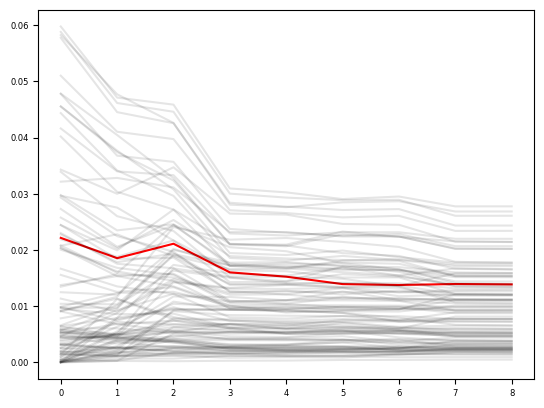

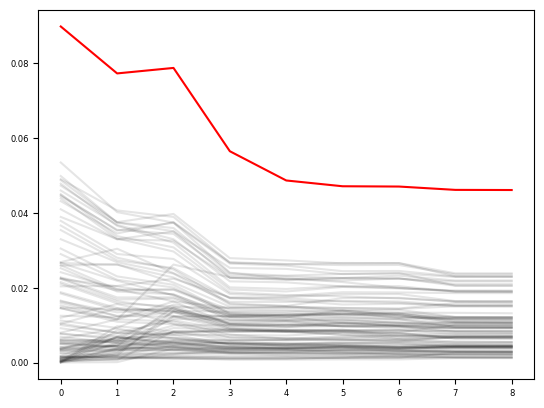

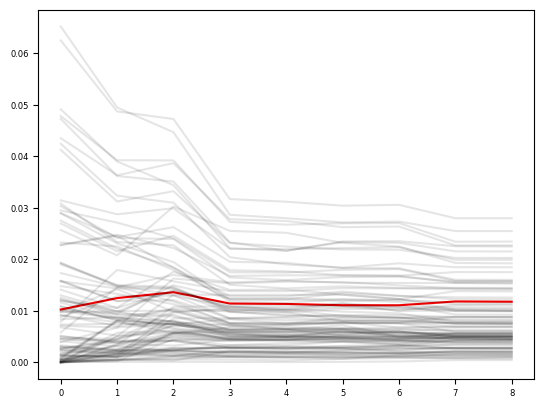

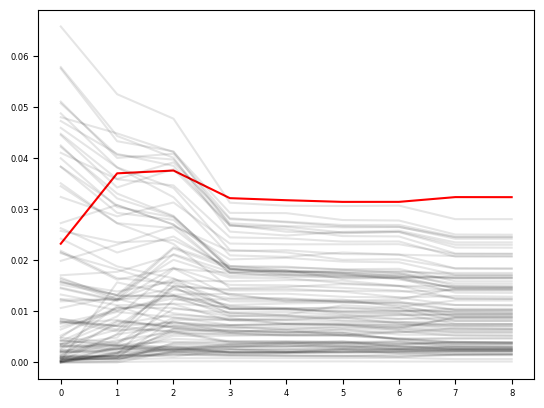

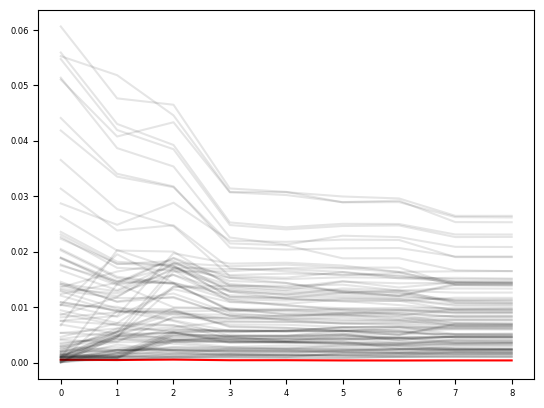

...

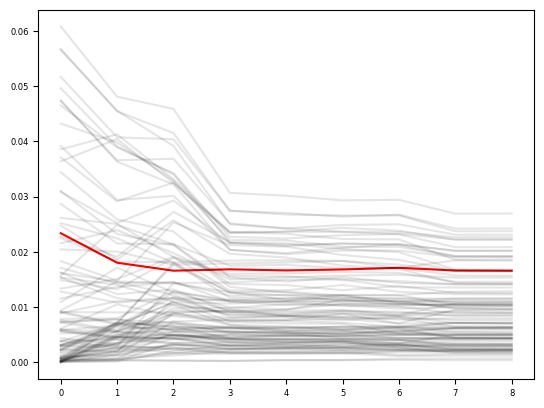

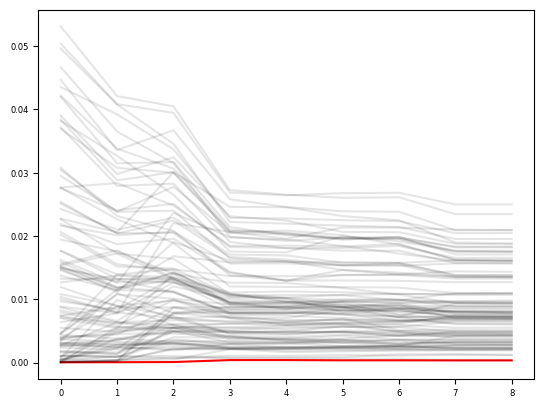

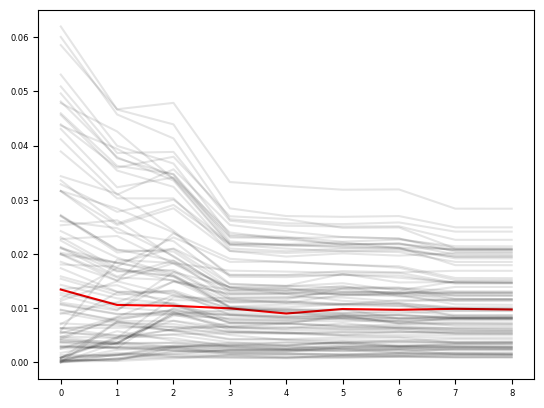

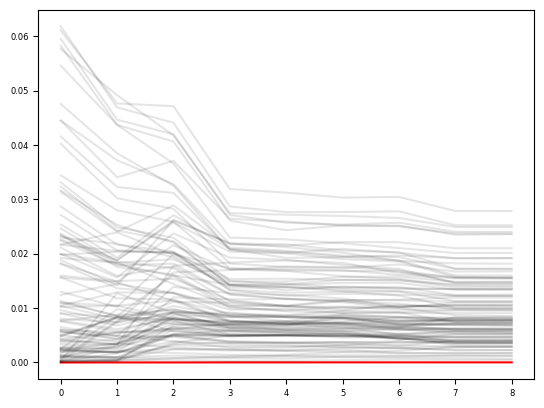

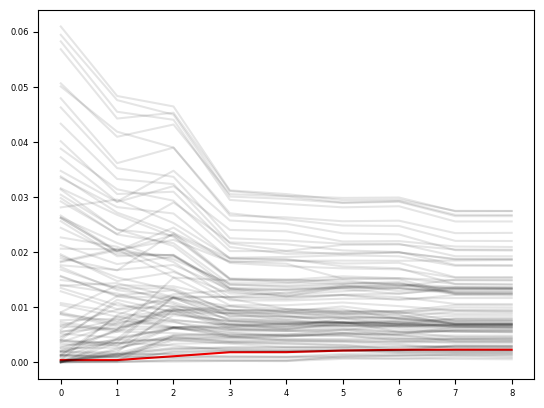

In [303]:
for j in range(len(cluster_centroids)):
    plt.plot(modularities[j], color='red')
    for i in range(modularities_null.shape[1]):
        plt.plot(modularities_null[j, i, :], color='black', alpha=0.1)
    plt.show()

# Generating gif

In [60]:
from PIL import Image

In [61]:
def figure_to_array(fig):
    fig.canvas.draw()
    w, h = fig.canvas.get_width_height()
    array = np.fromstring(fig.canvas.tostring_argb(), dtype=np.uint8)
    array.shape = (h, w, 4)
    array = np.roll(array, 3, axis=2)
    return array


def save_figures_as_gif(path, figures, fps=30):
    images = []
    for figure in figures:
        array = figure_to_array(figure)
        image = Image.fromarray(array)
        images.append(image)
    images[0].save(path, save_all=True, append_images=images[1:], optimize=False, duration=1000/fps, loop=0)

In [62]:
for j in range(len(rseries)):

    if j > 15:
    
        timeseries = rseries[j]
        
        figures = []
        for i in tqdm(range(timeseries.shape[1]), file=sys.stdout):
            
            state = timeseries[:, i]
            CAP = state.reshape(R, 1) @ state.reshape(1, R)
            
            fig, ax = plt.subplots(figsize=(3, 3))
            plot_matrix_communities(ax, CAP, communities, vmin=-5, vmax=5)
            ax.set_title(r"$t={}$ s".format(i))
            plt.close()
        
            figures.append(fig)
        
        save_figures_as_gif('Gifs/dynamic_FC_fish{}.gif'.format(j + 1), figures, fps=50)

100%|█████████████████████████████████████████| 892/892 [00:14<00:00, 59.77it/s]


/tmp/ipykernel_7483/4288959989.py:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  array = np.fromstring(fig.canvas.tostring_argb(), dtype=np.uint8)


100%|█████████████████████████████████████████| 892/892 [00:21<00:00, 41.08it/s]
